## Importing necessary libraries

In [1]:
import os                                  # for finding and listing the image files
import cv2                                 # for image preprocessing
import numpy as np                         # for calculation of image tensors
from glob import glob                      # for filtering the image extension files from the other possible files in the directory
import imageio.v2 as imageio               # for making gif from GAN-generated pictures
import matplotlib.pyplot as plt            # for visualization of the GAN-generated pictures
from IPython.display import display, Image # for visualization of the GAN-generated gif
from time import time                      # for processing time recording per epoch

# Importing necessary Pytorch modules
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torch.utils.data import DataLoader, Dataset

## loading images

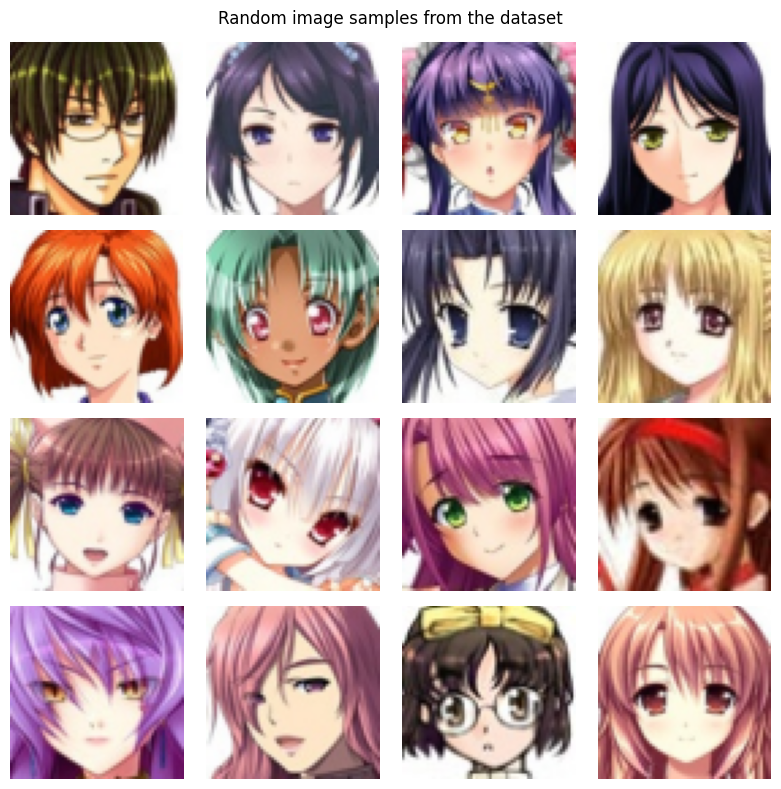

In [2]:
class ImageDataset(Dataset):
    def __init__(self, root_dir, transform=None): # Gather all possible image formats in the root directory
        self.image_paths = glob(os.path.join(root_dir, "*.jpg")) + \
                          glob(os.path.join(root_dir, "*.jpeg")) + \
                          glob(os.path.join(root_dir, "*.png"))
        self.transform = transform
    
    def __len__(self):
        return len(self.image_paths)    # returns the length of gathered images (dataset size)
    
    def __getitem__(self, idx):
        image = cv2.imread(self.image_paths[idx])      # Load images in BGR format by OpenCV
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # Convert images from BGR format to RGB format
        if self.transform:
            image = self.transform(image)
        return image

# Image transformations
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

# Load dataset
dataset = ImageDataset('../Datasets/Project3_GAN/', transform=transform)
dataloader = DataLoader(dataset, batch_size=32, shuffle=True)

# Create a 4x4 grid plot from 16 random images in the dataset
images = next(iter(dataloader))
indices = torch.randperm(images.size(0))[:16]
selected_images = images[indices]

fig, axes = plt.subplots(4, 4, figsize=(8, 8))
plt.suptitle('Random image samples from the dataset')

for i, ax in enumerate(axes.flat):
    img = selected_images[i].permute(1, 2, 0)  # Change shape from (C, H, W) to (H, W, C)
    img = (img * 0.5) + 0.5  # Denormalize
    ax.imshow(img.numpy())
    ax.axis('off')

plt.tight_layout()
plt.show()

## Defining Generator and Discriminator

In [3]:
# Define Generator
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(100, 8 * 8 * 256, bias=False),
            nn.BatchNorm1d(8 * 8 * 256),
            nn.ReLU(True),
            nn.Unflatten(1, (256, 8, 8)),
            nn.ConvTranspose2d(256, 128, kernel_size=5, stride=2, padding=2, output_padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.ConvTranspose2d(128, 64, kernel_size=5, stride=2, padding=2, output_padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.ConvTranspose2d(64, 32, kernel_size=5, stride=2, padding=2, output_padding=1, bias=False),
            nn.BatchNorm2d(32),
            nn.ReLU(True),
            nn.ConvTranspose2d(32, 3, kernel_size=5, stride=1, padding=2, bias=False),
            nn.Tanh()
        )
    
    def forward(self, x):
        return self.model(x)

# Define Discriminator
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=5, stride=2, padding=2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),
            nn.Conv2d(64, 128, kernel_size=5, stride=2, padding=2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),
            nn.Conv2d(128, 256, kernel_size=5, stride=2, padding=2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),
            nn.Flatten(),
            nn.Linear(8 * 8 * 256, 1)
        )
    
    def forward(self, x):
        return self.model(x)


# Initialize models for training on GPU (if available)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# Loss function and optimizers
criterion = nn.BCEWithLogitsLoss() # The criterion for loss optimization is Binary Cross Entropy with 
gen_optimizer = optim.Adam(generator.parameters(), lr=1e-4)
disc_optimizer = optim.Adam(discriminator.parameters(), lr=1e-4)

## Train and Optimization of GAN Model

Number of epochs:  30


:::Epoch 1::: calc_time: 150s -- disc_loss:0.3319 -- gen_loss:4.9429


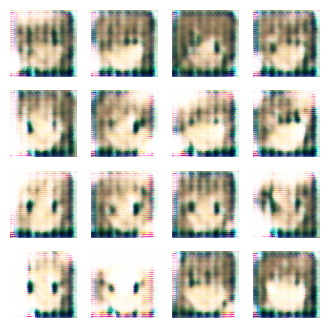

:::Epoch 2::: calc_time: 148s -- disc_loss:0.4131 -- gen_loss:3.5337
:::Epoch 3::: calc_time: 147s -- disc_loss:0.3328 -- gen_loss:4.0630
:::Epoch 4::: calc_time: 149s -- disc_loss:0.3703 -- gen_loss:4.1408
:::Epoch 5::: calc_time: 148s -- disc_loss:0.4162 -- gen_loss:3.8988


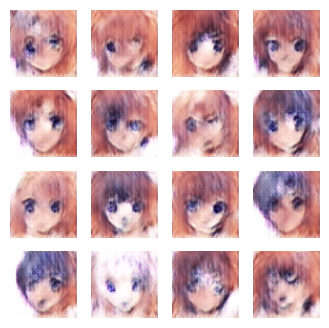

:::Epoch 6::: calc_time: 148s -- disc_loss:0.3891 -- gen_loss:4.1485
:::Epoch 7::: calc_time: 148s -- disc_loss:0.3975 -- gen_loss:3.8107
:::Epoch 8::: calc_time: 149s -- disc_loss:0.4444 -- gen_loss:3.7433
:::Epoch 9::: calc_time: 149s -- disc_loss:0.4870 -- gen_loss:3.5450
:::Epoch 10::: calc_time: 149s -- disc_loss:0.5274 -- gen_loss:3.2276


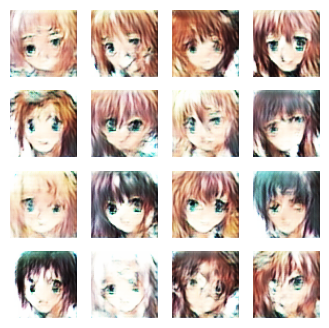

:::Epoch 11::: calc_time: 149s -- disc_loss:0.5753 -- gen_loss:3.0580
:::Epoch 12::: calc_time: 148s -- disc_loss:0.5706 -- gen_loss:2.8740
:::Epoch 13::: calc_time: 149s -- disc_loss:0.5872 -- gen_loss:2.8958
:::Epoch 14::: calc_time: 151s -- disc_loss:0.6031 -- gen_loss:2.8333
:::Epoch 15::: calc_time: 148s -- disc_loss:0.6298 -- gen_loss:2.7131


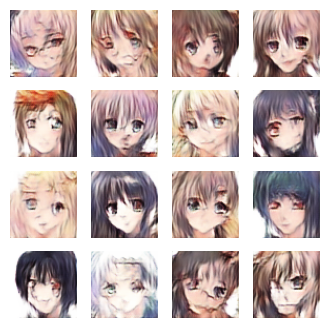

:::Epoch 16::: calc_time: 149s -- disc_loss:0.6482 -- gen_loss:2.7023
:::Epoch 17::: calc_time: 148s -- disc_loss:0.6402 -- gen_loss:2.6433
:::Epoch 18::: calc_time: 148s -- disc_loss:0.6500 -- gen_loss:2.5545
:::Epoch 19::: calc_time: 147s -- disc_loss:0.6587 -- gen_loss:2.5545
:::Epoch 20::: calc_time: 149s -- disc_loss:0.6903 -- gen_loss:2.4517


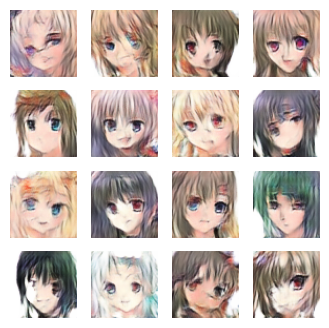

:::Epoch 21::: calc_time: 148s -- disc_loss:0.7004 -- gen_loss:2.4598
:::Epoch 22::: calc_time: 148s -- disc_loss:0.6991 -- gen_loss:2.4056
:::Epoch 23::: calc_time: 148s -- disc_loss:0.7173 -- gen_loss:2.3630
:::Epoch 24::: calc_time: 147s -- disc_loss:0.7098 -- gen_loss:2.4006
:::Epoch 25::: calc_time: 147s -- disc_loss:0.7181 -- gen_loss:2.3477


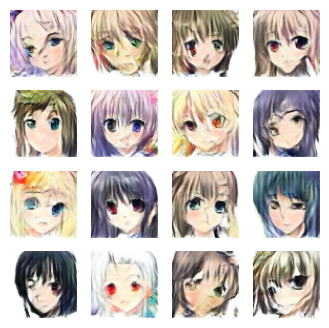

:::Epoch 26::: calc_time: 148s -- disc_loss:0.7155 -- gen_loss:2.3360
:::Epoch 27::: calc_time: 147s -- disc_loss:0.7170 -- gen_loss:2.3324
:::Epoch 28::: calc_time: 148s -- disc_loss:0.7116 -- gen_loss:2.3388
:::Epoch 29::: calc_time: 148s -- disc_loss:0.7047 -- gen_loss:2.3697
:::Epoch 30::: calc_time: 147s -- disc_loss:0.7123 -- gen_loss:2.3214


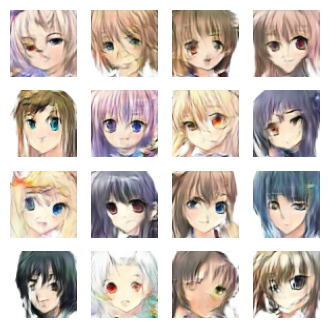

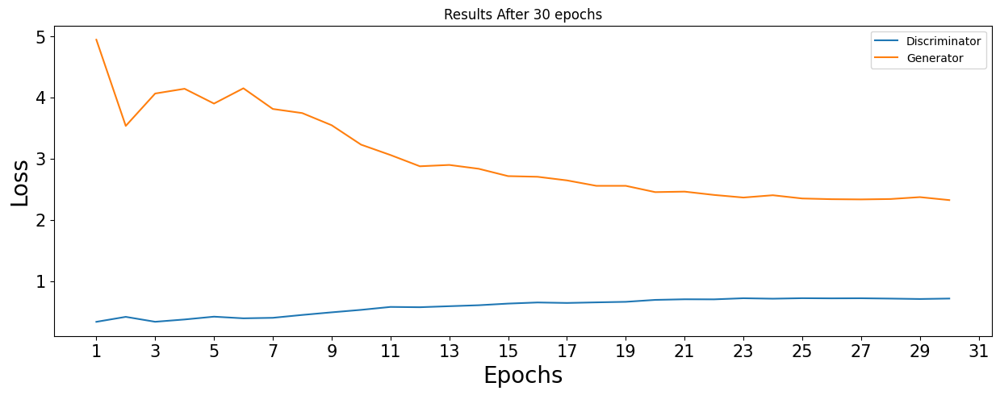

Do you want to continue? (Y: yes) or (press and enter any other key)  n


Training complete!


In [4]:
# Input image configs
noise_dim = 100
fixed_noise = torch.randn(16, noise_dim, device=device) # Generating 16 input noise vectors for generating 16 GAN-generated images
os.makedirs("generated_images", exist_ok=True) # Create directory to save images

# Training parameters
resume = 'Y'
epoch_start = 1  # Track where to start next
epochs = int(input("Number of epochs: "))  # Initial number of epochs
avg_losses = [[],[]] # Track gen_loss and disc_loss values over epochs (the first one is for disc_loss and the second is for gen_loss)

# Training loop
while resume == 'Y': # (Based on the user's decision, the training epochs continues up to certain number of epochs)
    for epoch in range(epoch_start, epochs + 1):
        losses = [[],[]] # Track gen_loss (first) and disc_loss (second) values over epochs.
        
        start_time = time() # epochs processing start time
        for real_images in dataloader:
            real_images = real_images.to(device) # loading data on the device
            batch_size = real_images.size(0)     # images batch size

            # Train Discriminator
            noise = torch.randn(batch_size, noise_dim, device=device) # generating input noise based on Normal distribution
            fake_images = generator(noise)  # Generate fake images with the generator
            
            # build the labels for images (real= 1 and fake = 0)
            real_labels = torch.ones(batch_size, 1, device=device) 
            fake_labels = torch.zeros(batch_size, 1, device=device)

            # training discriminator with both group of images (fake and real)
            real_output = discriminator(real_images)
            fake_output = discriminator(fake_images.detach())

            # calculate loss values for discriminator to assess the number incorrectly recognized images from both groups (fake and real)
            disc_loss = criterion(real_output, real_labels) + criterion(fake_output, fake_labels)
            losses[0].append(disc_loss.item())
            
            # Optimization of discriminotor with Adam based on Loss values
            disc_optimizer.zero_grad()
            disc_loss.backward()
            disc_optimizer.step()

            # Train Generator
            fake_output = discriminator(fake_images) # labels of fake images predicted by discriminator
            gen_loss = criterion(fake_output, real_labels) # calculate generator loss based on number of mistakes made by discriminator
            losses[1].append(gen_loss.item())
            
            # Optimization of generator with Adam based on Loss values
            gen_optimizer.zero_grad()
            gen_loss.backward()
            gen_optimizer.step()

        avg_losses[0].append(np.average(losses[0]))
        avg_losses[1].append(np.average(losses[1]))
        
        # Generate images every epoch
        with torch.no_grad():
            generated_images = generator(fixed_noise).cpu()
            generated_images = (generated_images + 1) / 2

        print(f':::Epoch {epoch}::: calc_time: {time() - start_time:.0f}s -- disc_loss:{avg_losses[0][epoch-1]:.4f} -- gen_loss:{avg_losses[1][epoch-1]:.4f}')
        if (epoch == 1) | (epoch%5==0):
            plt.figure(figsize=(4, 4))
            for i in range(generated_images.size(0)):
                plt.subplot(4, 4, i + 1)
                plt.imshow(np.transpose(generated_images[i].numpy(), (1, 2, 0)))
                plt.axis('off')
                # Normalize and save each image individually as JPG
            vutils.save_image(generated_images, f"GAN_generated_images/epoch_{epoch}.jpg", nrow=4, normalize=True) 
            plt.show()
        else:
            # Normalize and save each image individually as JPG
            vutils.save_image(generated_images, f"GAN_generated_images/epoch_{epoch}.jpg", nrow=4, normalize=True) 
            
        
    # Print the average loss per peoch for generator and discriminator
    plt.figure(figsize=(15, 5))
    plt.title(f'Results After {epochs} epochs')
    for i in range(1,len(avg_losses)+1):
        if epochs <= 10:
            xticks_step = 1
        else:
            xticks_step = round(epochs/20)
        plt.xticks(np.arange(1,epochs+2,step=xticks_step), fontsize=15)
        plt.yticks(fontsize=15)
        plt.xlabel('Epochs', fontsize=20)
        plt.ylabel('Loss', fontsize=20)
        if i == 1:
            plt.plot(range(1,epochs+1),avg_losses[i-1], label='Discriminator')
        elif i ==2:
            plt.plot(range(1,epochs+1),avg_losses[i-1], label='Generator')
    plt.legend()
    plt.show()

    # Ask if user wants to continue
    resume = input("Do you want to continue? (Y: yes) or (press and enter any other key) ")
    if resume == 'Y':
        add_epochs = int(input("Number of added epochs: "))
        epoch_start = epochs + 1  # Start from the next epoch
        epochs += add_epochs  # Increase total epochs
    else:
        print("Training complete!")

## Create and display GIF from saved images

GIF saved as 'GAN_generated_images/training_evolution.gif'


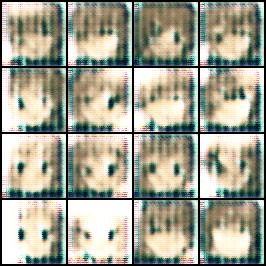

In [5]:
image_paths = sorted(glob("GAN_generated_images/epoch_*.jpg"), key=lambda x: int(x.split('_')[-1].split('.')[0]))
images = [imageio.imread(img) for img in image_paths] # Load images in sorted order (based on epoch number)

# Generate interpolated frames between two images for smoother transitions in the output GIF
def interpolate_frames(img1, img2, num_frames=100):
    frames = []
    for alpha in np.linspace(0, 1, num_frames):
        blended = cv2.addWeighted(img1, 1 - alpha, img2, alpha, 0)
        frames.append(blended)
    return frames
smooth_images = []
for i in range(len(images) - 1):
    smooth_images.append(images[i])  # Add original image
    smooth_images.extend(interpolate_frames(images[i], images[i + 1], num_frames=5))  # Add smooth transition frames
smooth_images.append(images[-1])  # Add the last image

# Save the all images as a GIF and display the GIF in Jupyter Notebook
imageio.mimsave("GAN_generated_images/training_evolution.gif", smooth_images, duration=0.5, loop=0)  
print("GIF saved as 'GAN_generated_images/training_evolution.gif'")

display(Image("GAN_generated_images/training_evolution.gif"))